In [1]:
import os
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import yaml
import shutil

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q /content/drive/MyDrive/plates_recognition/datasets.zipa

replace cars_detection/images/test/00000002.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

#Обучение модели детекции транспорта

### Эксперимент 1 (11 классов, размер 736х736)

In [ ]:
classes = {'bus':0, 'car':1,'non-motorized_vehicle':9, 'motorized_vehicle':2, 'articulated_truck':3, 'pickup_truck':4, 'single_unit_truck':5, 
                       'work_van':6, 'pedestrian':7, 'bicycle':8, 'motorcycle':10}                       

In [ ]:
def change_annotations(path):
    for label in os.listdir(path):
        with open(path+label, 'r') as f:
            text = f.readlines()
            for key, item in classes.items():        
                text = [i.replace(key, str(item)) for i in text]
            with open(path+label, 'w') as f1:
                [f1.write(str(i)) for i in text]
    print('OK')
    pass

In [ ]:
change_annotations('/content/cars_detection/labels/train/')
change_annotations('/content/cars_detection/labels/valid/')
change_annotations('/content/cars_detection/labels/test/')

OK


In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt  # install

In [ ]:
# создаем yaml файл
yaml_file = {'train':'../cars_detection/images/train' ,
            'val': '../cars_detection/images/valid',
            'nc' : '11',
            'names' : {0:'bus', 1:'car', 2:'motorized_vehicle', 3:'articulated_truck', 4:'pickup_truck', 5:'single_unit_truck', 
                       6:'work_van', 7:'pedestrian', 8:'bicycle', 9:'non-motorized_vehicle', 10:'motorcycle'}}

with open('vehicle_detection.yaml', 'w') as file:
    documents = yaml.dump(yaml_file, file)

In [ ]:
!python train.py --img 736 --batch 32 --epochs 10 --data vehicle_detection.yaml --cfg models/yolov5m.yaml 

train: weights=yolov5s.pt, cfg=models/yolov5m.yaml, data=vehicle_detection.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=32, imgsz=736, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-172-gc4c0ee8 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h

<function matplotlib.pyplot.show(*args, **kw)>

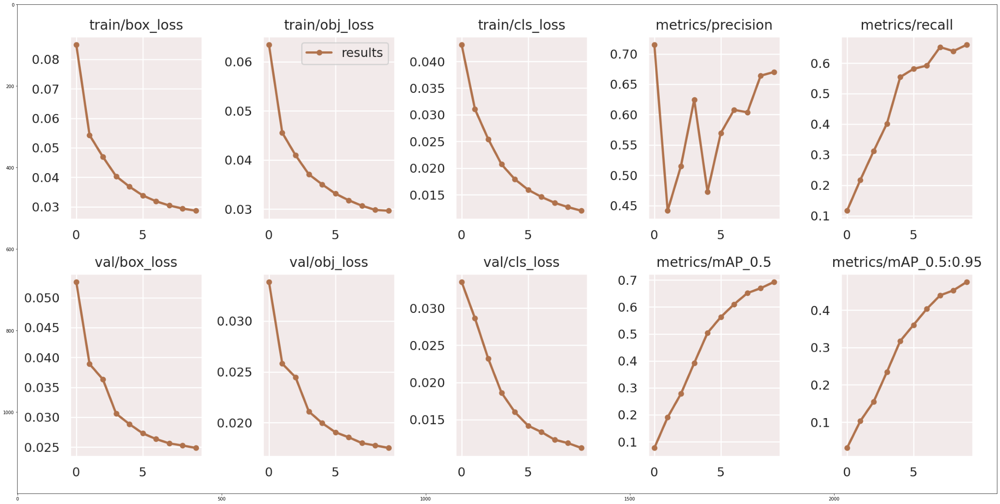

In [ ]:
img = cv2.imread('/content/yolov5/runs/train/exp/results.png')
plt.figure(figsize=(40,40))
plt.imshow(img)    
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

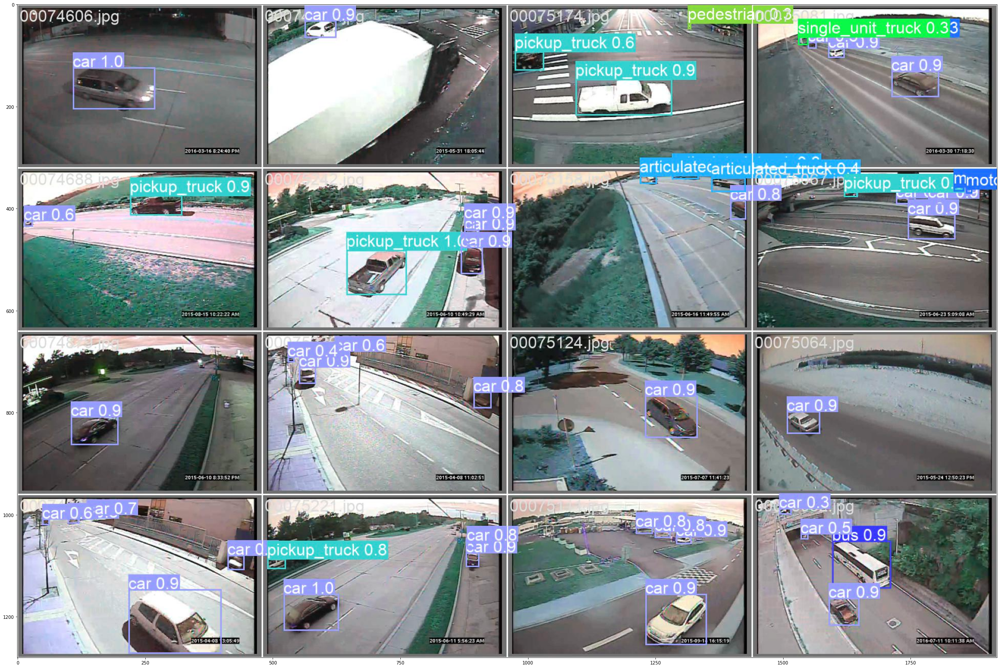

In [2]:
img = cv2.imread('/content/yolov5/runs/train/exp/val_batch_pred.png')
plt.figure(figsize=(40,40))
plt.imshow(img)    
plt.show

### Эксперимент 2 (7 классов, размер 416x416)

In [ ]:
df = pd.read_csv('/content/gt_train.csv', header=None)
df.columns=['name', 'class_name', 'x_min', 'y_min', 'x_max', 'y_max']
df.name = [f'{name:08}' + '.jpg' for name in df.name]

In [ ]:
classes = {'bus':0, 'car':1, 'articulated_truck':2, 'pickup_truck':3, 'single_unit_truck':4, 'work_van':5, 'motorcycle':6}        

In [ ]:
def delete_file(path, df):
    name_list = os.listdir(path)
    print('Dataset lenght: ', len(name_list))
    df = df.loc[df.name.isin(name_list)]
    delete_file = df.loc[~df.class_name.isin(list(classes.keys()))].name
    for file in delete_file.unique():
        if os.path.isfile(os.path.join(path, file)):
            os.remove(os.path.join(path, file))
        else: 
            print("Error: %s file not found" % file)    
    print('Crop dataset lenght: ', len(os.listdir(path)))
    return delete_file

In [ ]:
del_train = delete_file('/content/cars_detection/images/train', df)             
del_val = delete_file('/content/cars_detection/images/valid', df)
del_test = delete_file('/content/cars_detection/images/test', df)

Dataset lenght:  28688
Crop dataset lenght:  18866
Dataset lenght:  6813
Crop dataset lenght:  4924
Dataset lenght:  2699
Crop dataset lenght:  1978


In [ ]:
change_annotations('/content/cars_detection/labels/train/')
change_annotations('/content/cars_detection/labels/valid/')
change_annotations('/content/cars_detection/labels/test/')

OK
OK
OK


In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt  # install

In [ ]:
# создаем yaml файл
yaml_file = {'train':'../cars_detection/images/train' ,
            'val': '../cars_detection/images/valid',
            'nc' : '7',
            'names' : {0:'bus', 1:'car', 2:'articulated_truck', 3:'pickup_truck', 4:'single_unit_truck', 5:'work_van', 6:'motorcycle'}
             }

with open('vehicle_detection.yaml', 'w') as file:
    documents = yaml.dump(yaml_file, file)

In [ ]:
!python train.py --img 416 --batch 32 --epochs 20 --data vehicle_detection.yaml --cfg models/yolov5m.yaml 

train: weights=yolov5s.pt, cfg=models/yolov5m.yaml, data=vehicle_detection.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-183-gc98128f Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h

<function matplotlib.pyplot.show(*args, **kw)>

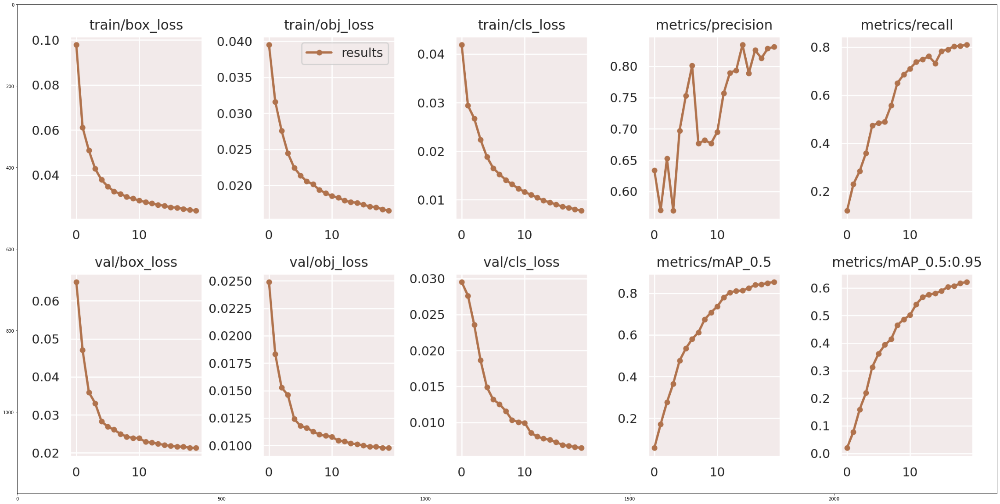

In [ ]:
img = cv2.imread('/content/yolov5/runs/train/exp/results.png')
plt.figure(figsize=(40,40))
plt.imshow(img)    
plt.show

In [ ]:
!python detect.py --img 416 --source /content/cars_detection/images/test/  --weights runs/train/exp/weights/best.pt --conf 0.4

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/cars_detection/images/test/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-183-gc98128f Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20877180 parameters, 0 gradients, 47.9 GFLOPs
image 1/1978 /content/cars_detection/images/test/00000032.jpg: 288x416 3 cars, 15.7ms
image 2/1978 /content/cars_detection/images/test/00000048.jpg: 288x416 5 cars, 3 pickup_trucks, 14.6ms
image 3/1978 /content/cars_detection/images/test/00000167.jpg: 288x416 1 car, 14.6ms
image 4/1978 /content/cars_detection/images/test/0000

In [ ]:
!cp -av '/content/yolov5/runs/train/exp' '/content/drive/MyDrive'

In [ ]:
!cp -av '/content/yolov5/runs/detect/exp3' '/content/drive/MyDrive'

<function matplotlib.pyplot.show(*args, **kw)>

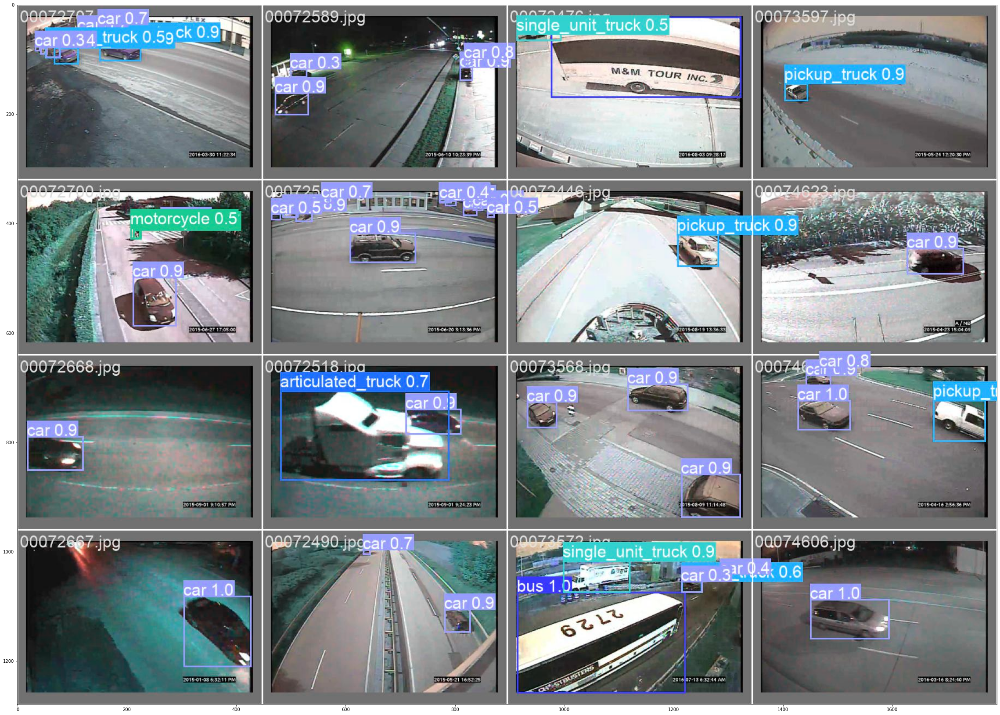

In [3]:
img = cv2.imread('/content/yolov5/runs/train/exp/val_batch_pred.png')
plt.figure(figsize=(40,40))
plt.imshow(img)    
plt.show

### Эксперимент 3 (7 классов, размер 416х416, изменение гиперпараметров)

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt  # install

In [ ]:
hyps = """
# YOLOv5 by Ultralytics, GPL-3.0 license
# Hyperparameters for COCO training from scratch
# python train.py —batch 40 —cfg yolov5m.yaml —weights » —data coco.yaml —img 640 —epochs 300
# See tutorials for hyperparameter evolution https://github.com/ultralytics/yolov5#tutorials
lr0: 0.1  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.1  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok) !
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.15  # IoU training threshold !
anchor_t: 4.0  # anchor-multiple threshold 
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 5.0  # image rotation (+/- deg) !
translate: 0.1  # image translation (+/- fraction)!
scale: 0.5  # image scale (+/- gain)
shear: 5.0  # image shear (+/- deg) !
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability) !
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.0  # image mixup (probability)
copy_paste: 0.0  # segment copy-paste (probability)
"""

In [ ]:
with open('./data/hyps/hyp.var_1.yaml', 'w') as fp:
    fp.write(hyps)


In [ ]:
# создаем yaml файл
yaml_file = {'train':'../cars_detection/images/train' ,
            'val': '../cars_detection/images/valid',
            'nc' : '7',
            'names' : {0:'bus', 1:'car', 2:'articulated_truck', 3:'pickup_truck', 4:'single_unit_truck', 5:'work_van', 6:'motorcycle'}
             }

with open('vehicle_detection.yaml', 'w') as file:
    documents = yaml.dump(yaml_file, file)

In [ ]:
!python train.py --img 416 --batch 32 --epochs 20 --data vehicle_detection.yaml --cfg models/yolov5m.yaml --hyp data/hyps/hyp.var_1.yaml

train: weights=yolov5s.pt, cfg=models/yolov5m.yaml, data=vehicle_detection.yaml, hyp=data/hyps/hyp.var_1.yaml, epochs=20, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-183-gc98128f Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.1, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.15, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015,

<function matplotlib.pyplot.show(*args, **kw)>

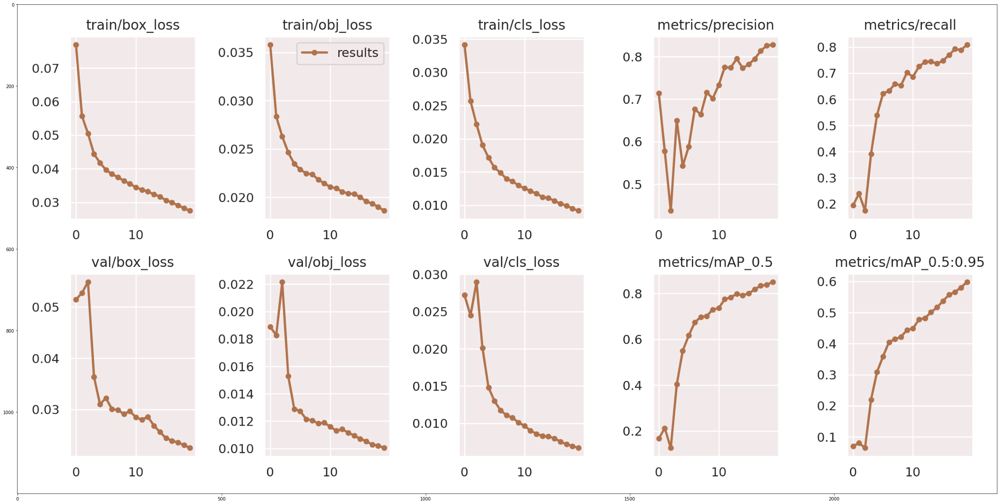

In [ ]:
img = cv2.imread('/content/yolov5/runs/train/exp/results.png')
plt.figure(figsize=(40,40))
plt.imshow(img)    
plt.show

In [ ]:
!python detect.py --img 416 --source /content/cars_detection/images/test/  --weights runs/train/exp/weights/best.pt --conf 0.25

#Обучение модели детекции номера



### Эксперимент 1

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt  # install

In [ ]:
# создаем yaml файл

yaml_file = {'train':'../plates_detection/images/train' ,
            'val': '../plates_detection/images/valid',
            'nc' : '1',
            'names' : ['plates']}

with open('plates_detection.yaml', 'w') as file:
    documents = yaml.dump(yaml_file, file)

In [ ]:
!python train.py --img 256 --batch 64 --epochs 50 --data plates_detection.yaml --cfg models/yolov5m.yaml

train: weights=yolov5s.pt, cfg=models/yolov5m.yaml, data=plates_detection.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=64, imgsz=256, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-172-gc4c0ee8 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=

<function matplotlib.pyplot.show(*args, **kw)>

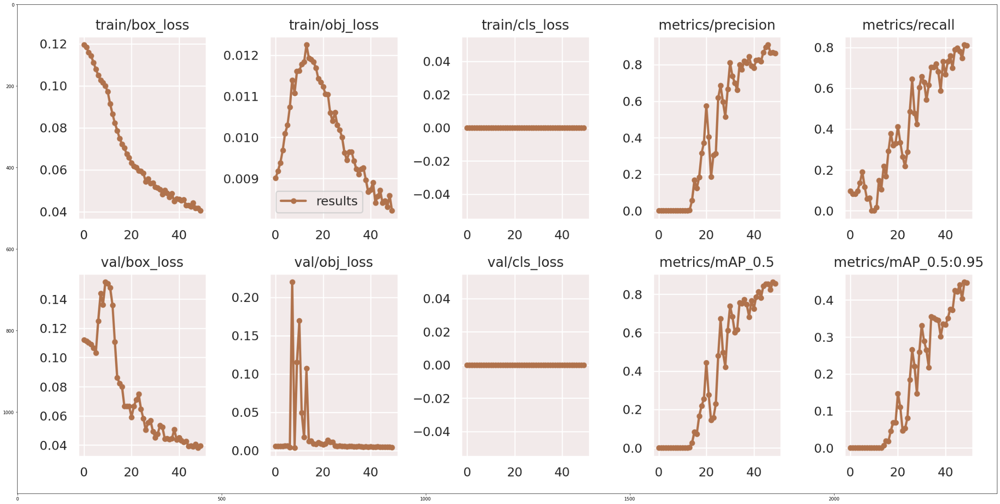

In [ ]:
img = cv2.imread('/content/yolov5/runs/train/exp/results.png')
plt.figure(figsize=(40,40))
plt.imshow(img)    
plt.show

In [ ]:
!python detect.py --img 256 --source /content/yolov5/plates_detection/images/test/  --weights last.pt --conf 0.25

detect: weights=['last.pt'], source=/content/yolov5/plates_detection/images/test/, data=data/coco128.yaml, imgsz=[256, 256], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-185-ge4398cf Python-3.7.14 torch-1.12.1+cu113 CPU

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/112 /content/yolov5/plates_detection/images/test/13.jpg: 224x256 1 plates, 226.4ms
image 2/112 /content/yolov5/plates_detection/images/test/14.jpg: 160x256 3 platess, 172.4ms
image 3/112 /content/yolov5/plates_detection/images/test/16.jpg: 224x256 2 platess, 201.4ms
image 4/112 /content/yolov5/plates_detection/images/test/171.jpg: 192x256 3 platess, 188.

In [ ]:
!python detect.py --img 256 --source /content/plates_detection/images/test/  --weights runs/train/exp/weights/best.pt --conf 0.25

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/plates_detection/images/test/, data=data/coco128.yaml, imgsz=[256, 256], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-172-gc4c0ee8 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/112 /content/plates_detection/images/test/13.jpg: 224x256 1 plates, 14.0ms
image 2/112 /content/plates_detection/images/test/14.jpg: 160x256 4 platess, 13.2ms
image 3/112 /content/plates_detection/images/test/16.jpg: 224x256 2 platess, 11.9ms
image 4/112 /content/plates_detection/images/test/171.jpg: 192x256 3 plat

###Эксперимент 2 (изменение гиперпараметров)

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt  # install

In [ ]:
# создаем yaml файл

yaml_file = {'train':'../plates_detection/images/train' ,
            'val': '../plates_detection/images/valid',
            'nc' : '1',
            'names' : ['plates']}

with open('plates_detection.yaml', 'w') as file:
    documents = yaml.dump(yaml_file, file)

In [ ]:
hyps = """
# YOLOv5 by Ultralytics, GPL-3.0 license
# Hyperparameters for COCO training from scratch
# python train.py —batch 40 —cfg yolov5m.yaml —weights » —data coco.yaml —img 640 —epochs 300
# See tutorials for hyperparameter evolution https://github.com/ultralytics/yolov5#tutorials
lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.01  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 2.0  # warmup epochs (fractions ok) !
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.30  # IoU training threshold !
anchor_t: 3.0  # anchor-multiple threshold !
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 15.0  # image rotation (+/- deg) !
translate: 0.2  # image translation (+/- fraction)!
scale: 0.5  # image scale (+/- gain)
shear: 15.0  # image shear (+/- deg) !
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.5  # image flip up-down (probability) !
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.0  # image mixup (probability)
copy_paste: 0.0  # segment copy-paste (probability)
"""

In [ ]:
with open('./data/hyps/hyp.var_1.yaml', 'w') as fp:
    fp.write(hyps)


In [ ]:
!python train.py --img 256 --batch 64 --epochs 50 --data plates_detection.yaml --cfg models/yolov5m.yaml --hyp data/hyps/hyp.var_1.yaml

train: weights=yolov5s.pt, cfg=models/yolov5m.yaml, data=plates_detection.yaml, hyp=data/hyps/hyp.var_1.yaml, epochs=50, batch_size=64, imgsz=256, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-181-g8a19437 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=2.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.3, anchor_t=3.0, fl_gamma=0.0, hsv_h=0.015,

<function matplotlib.pyplot.show(*args, **kw)>

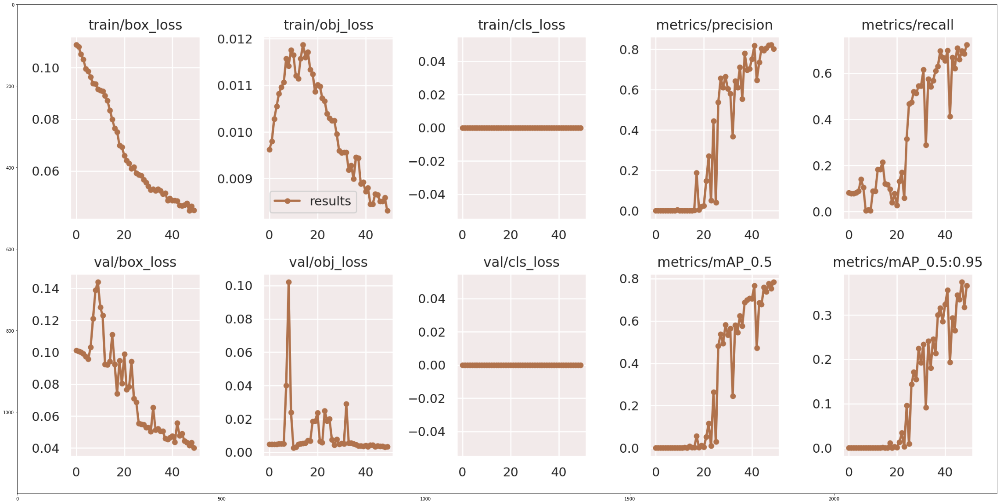

In [ ]:
img = cv2.imread('/content/yolov5/runs/train/exp/results.png')
plt.figure(figsize=(40,40))
plt.imshow(img)    
plt.show

In [ ]:
!python detect.py --img 256 --source /content/plates_detection/images/test/  --weights runs/train/exp/weights/best.pt --conf 0.25

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/plates_detection/images/test/, data=data/coco128.yaml, imgsz=[256, 256], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-181-g8a19437 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/112 /content/plates_detection/images/test/13.jpg: 224x256 1 plates, 14.3ms
image 2/112 /content/plates_detection/images/test/14.jpg: 160x256 (no detections), 14.1ms
image 3/112 /content/plates_detection/images/test/16.jpg: 224x256 3 platess, 12.2ms
image 4/112 /content/plates_detection/images/test/171.jpg: 192x256 

###Эксперимент 3 (изменение гиперпараметров)

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt  # install

In [ ]:
# создаем yaml файл

yaml_file = {'train':'../plates_detection/images/train' ,
            'val': '../plates_detection/images/valid',
            'nc' : '1',
            'names' : ['plates']}

with open('plates_detection.yaml', 'w') as file:
    documents = yaml.dump(yaml_file, file)

In [ ]:
hyps = """
# YOLOv5 by Ultralytics, GPL-3.0 license
# Hyperparameters for COCO training from scratch
# python train.py —batch 40 —cfg yolov5m.yaml —weights » —data coco.yaml —img 640 —epochs 300
# See tutorials for hyperparameter evolution https://github.com/ultralytics/yolov5#tutorials
lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.01  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok) !
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.15  # IoU training threshold !
anchor_t: 4.0  # anchor-multiple threshold 
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 5.0  # image rotation (+/- deg) !
translate: 0.1  # image translation (+/- fraction)!
scale: 0.5  # image scale (+/- gain)
shear: 5.0  # image shear (+/- deg) !
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability) !
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.0  # image mixup (probability)
copy_paste: 0.0  # segment copy-paste (probability)
"""

In [ ]:
with open('./data/hyps/hyp.var_2.yaml', 'w') as fp:
    fp.write(hyps)


In [ ]:
!python train.py --img 256 --batch 64 --epochs 50 --data plates_detection.yaml --cfg models/yolov5m.yaml --hyp data/hyps/hyp.var_2.yaml

train: weights=yolov5s.pt, cfg=models/yolov5m.yaml, data=plates_detection.yaml, hyp=data/hyps/hyp.var_2.yaml, epochs=50, batch_size=64, imgsz=256, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Total 6 (delta 5), reused 5 (delta 5), pack-reused 0
Unpacking objects: 100% (6/6), done.
From https://github.com/ultralytics/yolov5
   8a19437..1158a50  master     -> origin/master
github: ⚠️ YOLOv5 is out of date by 1 commit. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to u

<function matplotlib.pyplot.show(*args, **kw)>

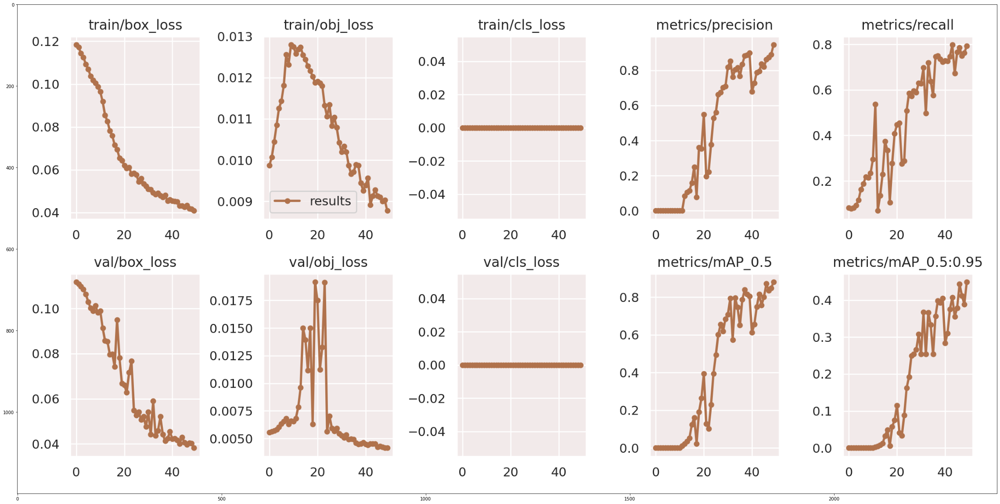

In [ ]:
img = cv2.imread('/content/yolov5/runs/train/exp2/results.png')
plt.figure(figsize=(40,40))
plt.imshow(img)    
plt.show

In [ ]:
!python detect.py --img 256 --source /content/plates_detection/images/test/  --weights runs/train/exp2/weights/best.pt --conf 0.25

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/plates_detection/images/test/, data=data/coco128.yaml, imgsz=[256, 256], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-181-g8a19437 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/112 /content/plates_detection/images/test/13.jpg: 224x256 1 plates, 15.7ms
image 2/112 /content/plates_detection/images/test/14.jpg: 160x256 3 platess, 14.0ms
image 3/112 /content/plates_detection/images/test/16.jpg: 224x256 2 platess, 12.8ms
image 4/112 /content/plates_detection/images/test/171.jpg: 192x256 2 pla

###Эксперимент 4 (лучшие гиперпараметры, 100 эпох)

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt  # install

In [ ]:
# создаем yaml файл

yaml_file = {'train':'../plates_detection/images/train' ,
            'val': '../plates_detection/images/valid',
            'nc' : '1',
            'names' : ['plates']}

with open('plates_detection.yaml', 'w') as file:
    documents = yaml.dump(yaml_file, file)

In [ ]:
hyps = """
# YOLOv5 by Ultralytics, GPL-3.0 license
# Hyperparameters for COCO training from scratch
# python train.py —batch 40 —cfg yolov5m.yaml —weights » —data coco.yaml —img 640 —epochs 300
# See tutorials for hyperparameter evolution https://github.com/ultralytics/yolov5#tutorials
lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.01  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok) !
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.15  # IoU training threshold !
anchor_t: 4.0  # anchor-multiple threshold !
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 5.0  # image rotation (+/- deg) !
translate: 0.1  # image translation (+/- fraction)!
scale: 0.5  # image scale (+/- gain)
shear: 5.0  # image shear (+/- deg) !
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability) !
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.0  # image mixup (probability)
copy_paste: 0.0  # segment copy-paste (probability)
"""

In [ ]:
with open('./data/hyps/hyp.var_3.yaml', 'w') as fp:
    fp.write(hyps)


In [ ]:
!python train.py --img 256 --batch 64 --epochs 100 --data plates_detection.yaml --cfg models/yolov5m.yaml --hyp data/hyps/hyp.var_3.yaml

train: weights=yolov5s.pt, cfg=models/yolov5m.yaml, data=plates_detection.yaml, hyp=data/hyps/hyp.var_3.yaml, epochs=100, batch_size=64, imgsz=256, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-182-g1158a50 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.15, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.01

<function matplotlib.pyplot.show(*args, **kw)>

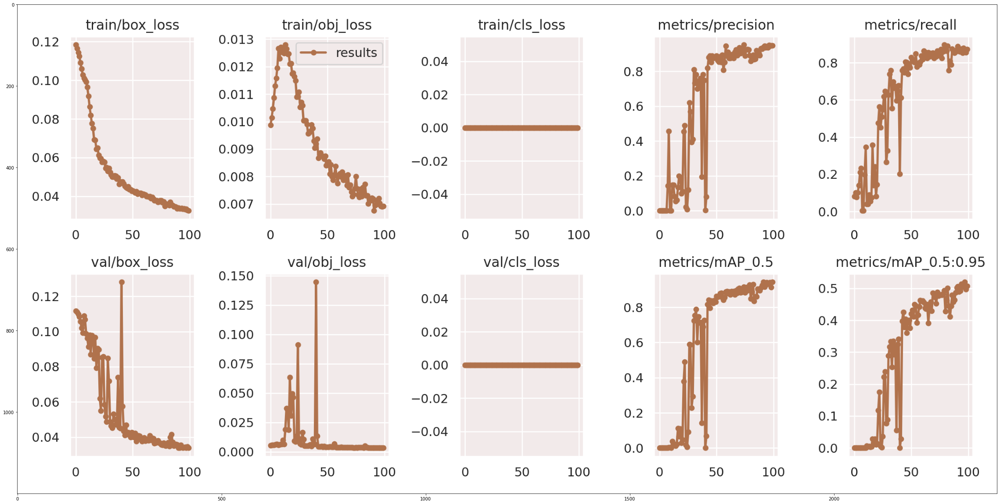

In [ ]:
img = cv2.imread('/content/yolov5/runs/train/exp/results.png')
plt.figure(figsize=(40,40))
plt.imshow(img)    
plt.show

In [ ]:
!python detect.py --img 256 --source /content/plates_detection/images/test/  --weights runs/train/exp/weights/best.pt --conf 0.4

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/plates_detection/images/test/, data=data/coco128.yaml, imgsz=[256, 256], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-182-g1158a50 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/112 /content/plates_detection/images/test/13.jpg: 224x256 1 plates, 14.2ms
image 2/112 /content/plates_detection/images/test/14.jpg: 160x256 2 platess, 13.4ms
image 3/112 /content/plates_detection/images/test/16.jpg: 224x256 2 platess, 12.2ms
image 4/112 /content/plates_detection/images/test/171.jpg: 192x256 3 plate

### Сводка по модели

In [ ]:
def get_results(path):
    result = pd.read_csv(path)
    result = result[['   metrics/precision','      metrics/recall','     metrics/mAP_0.5','metrics/mAP_0.5:0.95']]
    return result


result_1 = get_results('/content/results.csv')
result_2 = get_results('/content/results_2.csv')
result_3 = get_results('/content/results_3.csv')

In [ ]:
def plot_results(result_1, result_2, result_3):
  plt.figure(figsize=(24, 6))
  name = result_1.columns
  for i in range(4):
    plt.subplot(1,4,i+1)
    plt.plot(result_1[name[i]])
    plt.plot(result_2[name[i]])
    plt.plot(result_3[name[i]])
    plt.xlabel("Эпоха")
    plt.ylabel("{}".format(name[i]))
    #plt.xticks(range(0,num_epoch, 5))
    plt.legend(['Эксперимент_1', 'Эксперимент_2', 'Эксперимент_3'])
  plt.show()

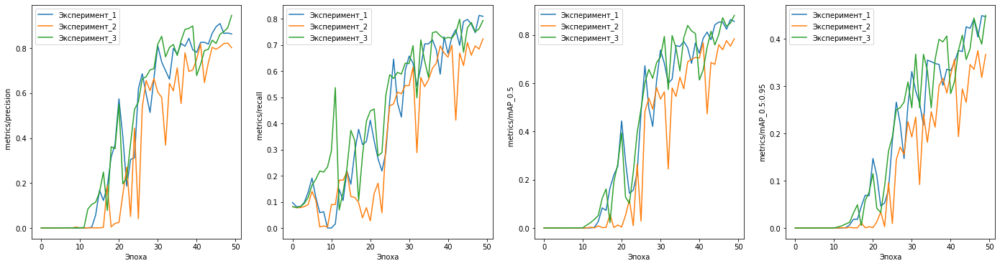

In [ ]:
plot_results(result_1, result_2, result_3)

In [ ]:
def plot_images(number):
    plt.figure(figsize=(28, 8))
    path = '/content/test/'
    for i in range(4):
        plt.subplot(1,4,i+1)
        img1 = cv2.imread(path+'{}_{}.jpg'.format(number, i+1))
        plt.imshow(img1)
        plt.title('Эксперимент_{}'.format(i+1))
    plt.show()

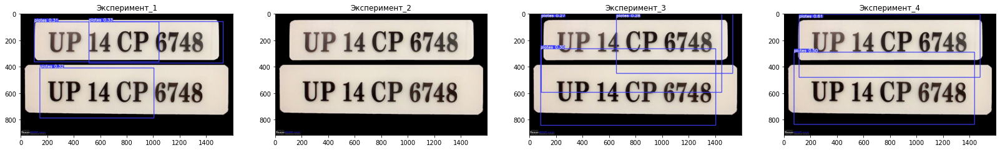

In [ ]:
plot_images(14)

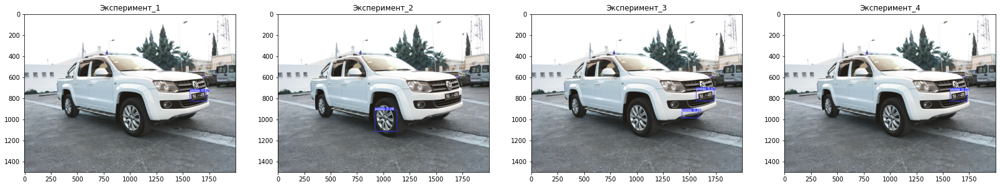

In [ ]:
plot_images(199)

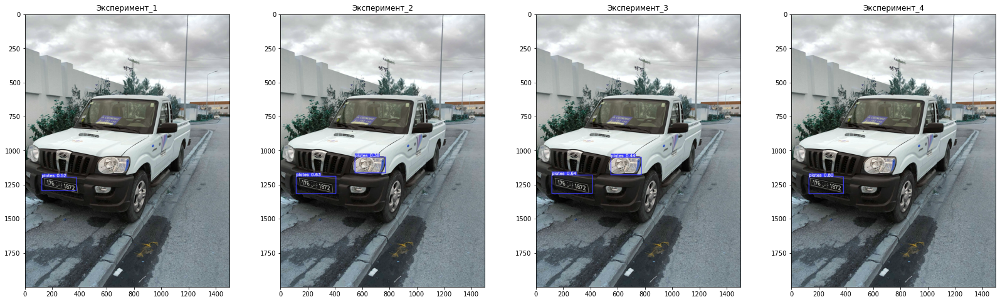

In [ ]:
plot_images(555)

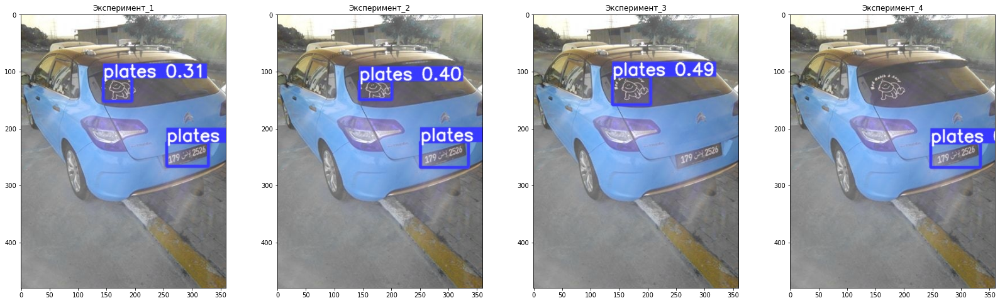

In [ ]:
plot_images(643)

#Загрузка обученной модели

In [ ]:
cars_detection = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/best.pt') 
cars_detection.eval()
img = cv2.imread('/content/00000022.jpg')
results = cars_detection(img)
results.pandas().xyxy[0]

,xmin,ymin,xmax,ymax,confidence,class,name
0,277.209686,145.906418,510.027557,374.278564,0.938834,1,car


In [ ]:
!cp -av '/content/yolov5/runs/detect/exp2' '/content/drive/MyDrive'